##Mengimport Library yang dibutuhkan

In [ ]:
# menyiapkan library yang akan digunakan
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Embedding, GlobalAveragePooling1D, Dense
import matplotlib.pyplot as plt
import numpy as np
import nltk
from nltk.corpus import stopwords
import json
from google.colab import files
import os
import zipfile

##Menyiapkan Dataset

In [ ]:
# mengimport dataset
files.upload()

Saving Test.csv.zip to Test.csv.zip


{'Test.csv.zip': b'PK\x03\x04-\x00\x00\x00\x08\x00\x86}|Oc\xf2@i\xff\xff\xff\xff\xff\xff\xff\xff\x08\x00\x14\x00Test.csv\x01\x00\x10\x00\xda\xe5d\x00\x00\x00\x00\x00\x96Q)\x00\x00\x00\x00\x00\xec\xbd\xdd\x92#G\xb2&v\x7f\x9e"\xbb\xcct\xaaj\x05\xd4\xb093g\x0eI\xd9\xd2\xaa\x7f\xc8.N7\xbb\x97\xd53\xd4\xe8\x86\'\x80\x0c\x009\x95\xc8\xc4\xe4O\xa1\xc1\xfb}\x85\xd53\xe8\x19$\x93\xcc\xce>\x90^A\xfe}\x9fGd\xa2\x9ak&\xb3\xbd]\xda\x0c\xd9]\x05dFxx\xf8\xef\xe7\xee\xff\xef\xff\xf9\xff\x0c\xf1\xd3\xb0\xa8\xc3*\xd6\xfftqW\x84\xfa\x18N}q\xec\xda!\x16\xc3\xae\xea\x8b>vU\xec\x8bv\xb3)B_\xacb\xd5l\x8bP\xac\xdb\xfd\xa1\x8e\xf6\x99~\xa8\x9a\x87\xe5&\xf6\x83\xfdn\x1d\xc6>\x16?T\xfb\xe2E\xac\xc7~W\x15G\xfbN\xd5<\xb6\xf5c,\xed\x0fE5,\x8a\xd0\x94\xc5.\x86\xc7\xaa>\xdd\x14/\xc6\xc1\xde\x13\x9b\xa2mbQ\x86\x93={\xe8\xc2\xb6Z\x17\xbbp8\xc4\xa6\x1fB\xb3\x8eE\xbb^\x8f]\x17\xcb\x9b\xe2v3\xc4\xce>\xf5\xf3\xae\xb2\xd7\xdf\xb7\x9f\x8am\xd8\xc7"6\xa5\xbd\xe1\xae\xe8b\xa8\xab_\xed\x8f\xc3.\xf0\xc9\xf6\x93=6\x83\x95\x84\xba

In [ ]:
# mengekstrak file dataset yang berupa zip
local_zip = '/content/Test.csv.zip'
local_unzip = zipfile.ZipFile(local_zip, 'r')
local_unzip.extractall('/content/')
local_unzip.close()

In [ ]:
# menyiapkan dataset yang akan digunakan
df = pd.read_csv('/content/Test.csv')
df.tail()

,text,label
4995,This is the kind of picture John Lassiter woul...,1
4996,A MUST SEE! I saw WHIPPED at a press screening...,1
4997,NBC should be ashamed. I wouldn't allow my chi...,0
4998,This movie is a clumsy mishmash of various gho...,0
4999,Formula movie about the illegitimate son of a ...,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    5000 non-null   object
 1   label   5000 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 78.2+ KB


##Data Preprocessing

In [ ]:
# mengubah case kata menjadi lower case
df['text'] = df['text'].str.lower()
df.head()

,text,label
0,i always wrote this series off as being a comp...,0
1,1st watched 12/7/2002 - 3 out of 10(dir-steve ...,0
2,this movie was so poorly written and directed ...,0
3,the most interesting thing about miryang (secr...,1
4,"when i first read about ""berlin am meer"" i did...",0


In [ ]:
# menghilangkan stop words
nltk.download('stopwords')
stop_word = set(stopwords.words('english'))

df['text'] = df['text'].apply(lambda x:' '.join([word for word in x.split() if word not in (stop_word)]))
df.head()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,text,label
0,always wrote series complete stink-fest jim be...,0
1,1st watched 12/7/2002 - 3 10(dir-steve purcell...,0
2,movie poorly written directed fell asleep 30 m...,0
3,interesting thing miryang (secret sunshine) ac...,1
4,"first read ""berlin meer"" expect much. thought ...",0


##Train dan Test Split

In [ ]:
# mengubah dataset menjadi numpy array
descriptions = df['text'].values
categories = df['label'].values

In [ ]:
# split dataset
x_train, x_test, y_train, y_test = train_test_split(descriptions, categories, test_size=0.2, shuffle=False)

print('Training dataset:\n', x_train.shape, y_train.shape)
print('\nTest dataset:\n', x_test.shape, y_test.shape)

Training dataset:
 (4000,) (4000,)

Test dataset:
 (1000,) (1000,)


##Menerapkan Word Index menggunakan Tokenizer

In [ ]:
# menghilangkan simbol
filt = '!"#$%&()*+.,-/:;=?@[\]^_`{|}~ '

tokenizer = Tokenizer(num_words=45000, oov_token="", filters=filt)
tokenizer.fit_on_texts(x_train)
tokenizer.fit_on_texts(x_test)

In [ ]:
# menyimpan word index kedalam file json
word_index = tokenizer.word_index
print(word_index)
with open('word_index.json', 'w') as fp:
    json.dump(word_index, fp)

{'': 1, '><br': 2, '<br': 3, 'movie': 4, 'film': 5, 'one': 6, 'like': 7, 'good': 8, 'it': 9, 'time': 10, 'even': 11, 'would': 12, 'story': 13, 'really': 14, 'see': 15, 'well': 16, 'much': 17, 'bad': 18, 'great': 19, 'get': 20, 'first': 21, 'people': 22, 'also': 23, 'made': 24, 'way': 25, 'could': 26, 'make': 27, 'movies': 28, '>the': 29, 'think': 30, 'characters': 31, 'two': 32, 'watch': 33, 'character': 34, 'many': 35, 'plot': 36, 'films': 37, 'seen': 38, 'acting': 39, 'never': 40, 'life': 41, 'know': 42, 'best': 43, 'love': 44, 'the': 45, 'show': 46, 'little': 47, 'ever': 48, 'end': 49, 'better': 50, 'scene': 51, 'man': 52, 'something': 53, 'scenes': 54, 'still': 55, 'say': 56, 'and': 57, 'go': 58, 'watching': 59, 'real': 60, 'back': 61, 'years': 62, 'old': 63, 'thing': 64, 'actors': 65, 'nothing': 66, 'though': 67, 'another': 68, "i'm": 69, 'going': 70, 'funny': 71, 'actually': 72, 'makes': 73, 'find': 74, 'work': 75, 'look': 76, '10': 77, 'new': 78, 'director': 79, 'every': 80, 'th

In [ ]:
# membuat sequences dan menambahkan padding
train_seq = tokenizer.texts_to_sequences(x_train)
test_seq = tokenizer.texts_to_sequences(x_test)
 
train_padded = pad_sequences(train_seq,
                             maxlen=200,
                             padding='post',
                             truncating='post')
test_padded = pad_sequences(test_seq,
                             maxlen=200,
                             padding='post',
                             truncating='post')

print("Train padded : ",train_padded.shape,"|  Test padded : ",test_padded.shape)
print(train_padded)
len(train_padded)

Train padded :  (4000, 200) |  Test padded :  (1000, 200)
[[  128   851   124 ...  2736   390   309]
 [ 2871   203  1534 ...     0     0     0]
 [    4   768   332 ...     0     0     0]
 ...
 [  357  6710    38 ...     0     0     0]
 [   42   520   648 ...     0     0     0]
 [  114     4 10105 ...    10   695     4]]


4000

##Membangun Model

In [ ]:
# membangun model sequential
model = tf.keras.Sequential([
    Embedding(45000, 200, input_length=200),
    GlobalAveragePooling1D(),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_12 (Embedding)    (None, 200, 200)          9000000   
                                                                 
 global_average_pooling1d_2   (None, 200)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
 dense_36 (Dense)            (None, 64)                12864     
                                                                 
 dense_37 (Dense)            (None, 32)                2080      
                                                                 
 dense_38 (Dense)            (None, 1)                 33        
                                                                 
Total params: 9,014,977
Trainable params: 9,014,977
Non-trainable params: 0
___________________________________________

In [ ]:
# mengcompile model
# menggunakan 'categorical_crossentropy'
# memanfaatkan optimizer 'adam'
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
    )

In [ ]:
# melatih model
num_epochs = 30
history = model.fit(
    train_padded,
    y_train, 
    epochs=num_epochs, 
    validation_data=(test_padded, y_test),
    verbose=2
    )

Epoch 1/30
125/125 - 14s - loss: 0.6423 - accuracy: 0.6633 - val_loss: 0.4581 - val_accuracy: 0.8060 - 14s/epoch - 110ms/step
Epoch 2/30
125/125 - 13s - loss: 0.2427 - accuracy: 0.9130 - val_loss: 0.3194 - val_accuracy: 0.8680 - 13s/epoch - 101ms/step
Epoch 3/30
125/125 - 13s - loss: 0.0638 - accuracy: 0.9840 - val_loss: 0.3817 - val_accuracy: 0.8620 - 13s/epoch - 100ms/step
Epoch 4/30
125/125 - 13s - loss: 0.0189 - accuracy: 0.9965 - val_loss: 0.4070 - val_accuracy: 0.8560 - 13s/epoch - 102ms/step
Epoch 5/30
125/125 - 13s - loss: 0.0077 - accuracy: 0.9987 - val_loss: 0.4624 - val_accuracy: 0.8470 - 13s/epoch - 101ms/step
Epoch 6/30
125/125 - 13s - loss: 0.0051 - accuracy: 0.9992 - val_loss: 0.4787 - val_accuracy: 0.8610 - 13s/epoch - 102ms/step
Epoch 7/30
125/125 - 13s - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.4996 - val_accuracy: 0.8590 - 13s/epoch - 101ms/step
Epoch 8/30
125/125 - 13s - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.5226 - val_accuracy: 0.8540 - 13s/epoch - 102

##Plotting Model

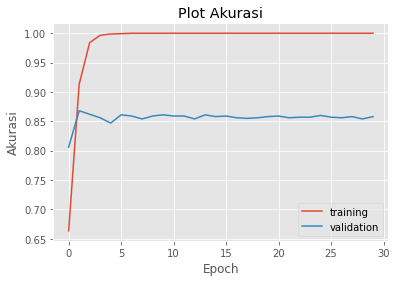

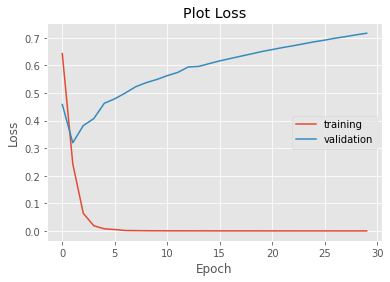

In [ ]:
# ploting accuracy model
# mengevaluasi model dengan plot accuracy dan loss
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, num_epochs), history.history["accuracy"], label="training")
plt.plot(np.arange(0, num_epochs), history.history["val_accuracy"], label="validation")
plt.title("Plot Akurasi")
plt.xlabel("Epoch")
plt.ylabel("Akurasi")
plt.legend()
plt.show()

plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, num_epochs), history.history["loss"], label="training")
plt.plot(np.arange(0, num_epochs), history.history["val_loss"], label="validation")
plt.title("Plot Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

##SaveModel

In [ ]:
model.save("model.h5")

##Convert Model ke Tensorflow.js

In [ ]:
# Install tensorflowjs

!pip install tensorflowjs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 84 kB 2.2 MB/s 
     |████████████████████████████████| 40 kB 5.7 MB/s 
     |████████████████████████████████| 189 kB 14.5 MB/s 
     |████████████████████████████████| 588.3 MB 4.3 kB/s 
     |████████████████████████████████| 16.2 MB 28.9 MB/s 
     |████████████████████████████████| 237 kB 50.0 MB/s 
     |████████████████████████████████| 154 kB 29.4 MB/s 
     |████████████████████████████████| 8.3 MB 7.3 MB/s 
     |████████████████████████████████| 51 kB 6.1 MB/s 
     |████████████████████████████████| 1.7 MB 48.6 MB/s 
     |████████████████████████████████| 6.0 MB 48.5 MB/s 
     |████████████████████████████████| 439 kB 47.7 MB/s 
     |████████████████████████████████| 85 kB 4.4 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
    

In [ ]:
# Convert model.h5 to model json
!tensorflowjs_converter --input_format=keras model.h5 tfjs_model

2022-11-23 05:53:23.330024: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2022-11-23 05:53:23.330299: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2022-11-23 05:53:23.330327: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


In [ ]:
!zip -r /content/tfjs_model.zip /content/tfjs_model

  adding: content/tfjs_model/ (stored 0%)
  adding: content/tfjs_model/group1-shard6of9.bin (deflated 7%)
  adding: content/tfjs_model/model.json (deflated 75%)
  adding: content/tfjs_model/group1-shard8of9.bin (deflated 8%)
  adding: content/tfjs_model/group1-shard7of9.bin (deflated 7%)
  adding: content/tfjs_model/group1-shard1of9.bin (deflated 7%)
  adding: content/tfjs_model/group1-shard2of9.bin (deflated 7%)
  adding: content/tfjs_model/group1-shard1of1.bin (deflated 8%)
  adding: content/tfjs_model/group1-shard9of9.bin (deflated 8%)
  adding: content/tfjs_model/group1-shard5of9.bin (deflated 7%)
  adding: content/tfjs_model/group1-shard3of9.bin (deflated 7%)
  adding: content/tfjs_model/group1-shard4of9.bin (deflated 7%)


In [ ]:
files.download('/content/tfjs_model.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>